In [1]:
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import seaborn as sns
from plotnine import *
%matplotlib inline
import calendar
from pandas.api.types import CategoricalDtype
import datetime as dt
import plotly.express as px
import plotly.graph_objects as go

#https://www.kaggle.com/datasets/theforcecoder/wind-power-forecasting?resource=download

### This is cleaning performed again to include bearing shaft and related missing rows. I only wanted to see what the trend for active power was across all years. (for most rows bearing shaft and other columns ha a lot of missing values but had the active power data)

In [2]:
df = pd.read_csv("Data/Turbine_Data.csv")
#Rename the Time column from unnamed
df.rename(columns={'Unnamed: 0':'Time'}, inplace = True)
#Convert the time column to a datatime object
df['Time']  = pd.to_datetime(df['Time'])
#Del Columns that provide no info / only 1 value
del(df["WTG"])
del(df["ControlBoxTemperature"])
#Drop all rows that don't have any values
noTime = df.drop('Time', axis=1, inplace=False)
df = pd.DataFrame(df[noTime.notnull().any(axis=1)])

#Since null values are less than 1% for these columns, drop the rows that contain them since they contain no usefull info
df = df.dropna(subset=["ActivePower", "ReactivePower", "WindSpeed"])
#Since these low percent distributions are skewed, replace null with median
# nullPer =  df.isnull().sum() / df.shape[0]
# lowNullCount = []
# for nullP in nullPer:
#     if((nullP > 0.0) & (nullP < .05)):
#         lowNullCount.append(nullPer[nullPer == nullP].index[0])
# for col in lowNullCount:
#     df[col].fillna(df[col].median(), inplace=True)
# Removing columns that have high correlations and similar distributions
# among the correlated columns, we remove the ones with lowest null values 
to_drop = ['GearboxOilTemperature','Blade2PitchAngle', 'Blade3PitchAngle','GeneratorWinding1Temperature',
           'RotorRPM','NacellePosition']
# we skip WindSpeed since it seems to have a much different distribution than ActivePower
# creating new dataframe by dropping the above columns
df_new = df.drop(to_drop, axis=1, inplace=False)
df = pd.DataFrame(df_new)
#removing outliers using the interquartile range
cols = list(df.columns)
[cols.remove(x) for x in ["Time"]]
# Noting that Blade1PitchAngle had more than 50% missing values

df.interpolate(method='pad', limit_direction='forward', axis = 0, inplace=True)
# impute remaining with median
for col in df.columns[1:]:
    df[col].fillna(df[col].median(), inplace=True)
# the distribuitions still show outliers on the extreme ends so we remove outliers using percentile
cols = list(df.columns)
[cols.remove(x) for x in ["Time"]]
upper = df[cols].quantile(0.99)
lower = df[cols].quantile(0.01)
df = df[~((df[cols] < lower) |(df[cols] > (upper))).any(axis=1)]


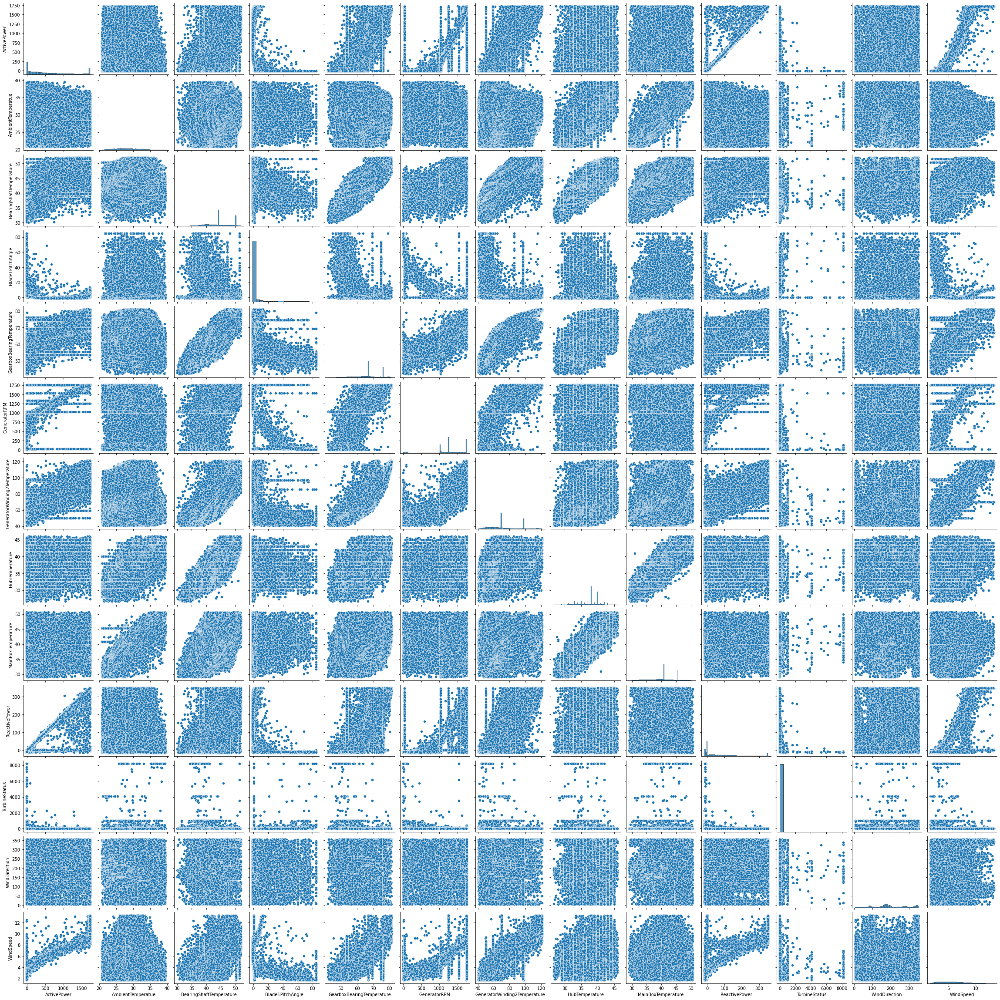

In [3]:
# checking for any relationship between variables 
df_noTime = df.drop("Time", axis=1, inplace=False)
sns.pairplot(df_noTime)

In [3]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 80965 entries, 144 to 118223
Data columns (total 14 columns):
 #   Column                        Non-Null Count  Dtype              
---  ------                        --------------  -----              
 0   Time                          80965 non-null  datetime64[ns, UTC]
 1   ActivePower                   80965 non-null  float64            
 2   AmbientTemperatue             80965 non-null  float64            
 3   BearingShaftTemperature       80965 non-null  float64            
 4   Blade1PitchAngle              80965 non-null  float64            
 5   GearboxBearingTemperature     80965 non-null  float64            
 6   GeneratorRPM                  80965 non-null  float64            
 7   GeneratorWinding2Temperature  80965 non-null  float64            
 8   HubTemperature                80965 non-null  float64            
 9   MainBoxTemperature            80965 non-null  float64            
 10  ReactivePower                 8

In [4]:
# resampling to include only daily averages. this makes analysis more concise
df_daily = df
df_daily = df.resample('D', on='Time').mean()
df_daily.reset_index(inplace=True)
df_daily.dropna(inplace=True)

df_daily.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 745 entries, 0 to 819
Data columns (total 14 columns):
 #   Column                        Non-Null Count  Dtype              
---  ------                        --------------  -----              
 0   Time                          745 non-null    datetime64[ns, UTC]
 1   ActivePower                   745 non-null    float64            
 2   AmbientTemperatue             745 non-null    float64            
 3   BearingShaftTemperature       745 non-null    float64            
 4   Blade1PitchAngle              745 non-null    float64            
 5   GearboxBearingTemperature     745 non-null    float64            
 6   GeneratorRPM                  745 non-null    float64            
 7   GeneratorWinding2Temperature  745 non-null    float64            
 8   HubTemperature                745 non-null    float64            
 9   MainBoxTemperature            745 non-null    float64            
 10  ReactivePower                 745 non-

In [5]:
# [(df_daily['Time'].dt.year == 2018) & (df_daily['Time'].dt.month == 1)]
fig = px.line(df_daily, x='Time', y='ActivePower', title="Active Power Over Time" )
# fig.update_xaxes(dtick="M1", tickformat="%b")
fig.show()

In [6]:
fig = px.line(df_daily, x='Time', y='BearingShaftTemperature', title="Bearing Tempurture Over Time" )
fig.show()